In [1]:
from PIL import Image
from IPython.display import display

import os
import numpy as np
import matplotlib.pyplot as plt

In [2]:
path = 'PuckerImages//RGB_cropped'
#path = 'TwistImages//RGB'
#path = 'FoldImages//RGB'
file_list = [f for f in os.listdir(path) if os.path.isfile(f'{path}//{f}')]

In [3]:
file_list

['Pucker24.png',
 'Pucker30.png',
 'Pucker21.png',
 'Pucker16.png',
 'Pucker28.png',
 'Pucker2.png',
 'Pucker29.png',
 'Pucker17.png',
 'Pucker8.png',
 'Pucker25.png',
 'Pucker23.png',
 'Pucker26.png',
 'Pucker11.png',
 'Pucker3.png',
 'Pucker4.png',
 'Pucker14.png',
 'Pucker27.png',
 'Pucker20.png',
 'Pucker12.png',
 'Pucker9.png',
 'Pucker5.png',
 'Pucker19.png',
 'Pucker31.png',
 'Pucker22.png',
 'Pucker6.png',
 'Pucker32.png',
 'Pucker15.png',
 'Pucker13.png',
 'Pucker10.png',
 'Pucker1.png',
 'Pucker7.png',
 'Pucker18.png']

Opened file: Pucker25.png


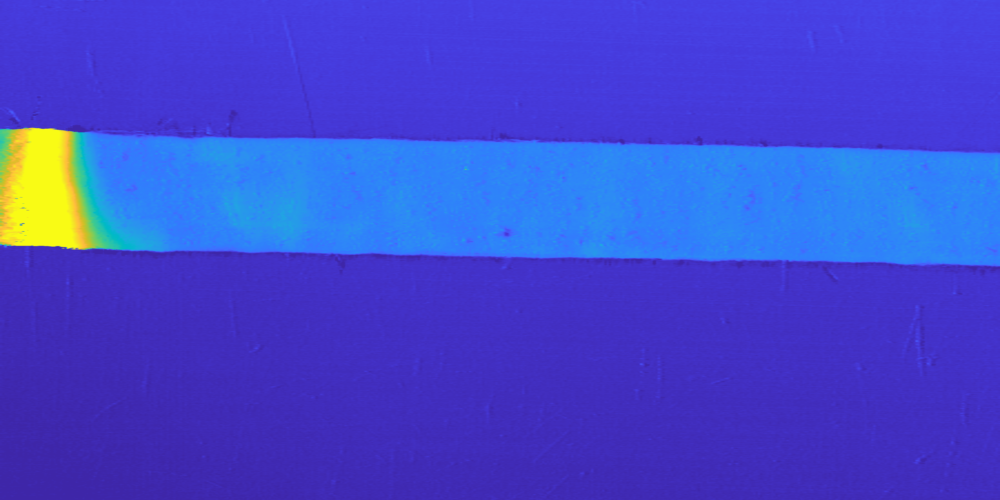

In [13]:
file = file_list[9]
file = file_list[9]
print(f'Opened file: {file}')
img = Image.open(f'{path}//{file}') 
display(img)



Image array shape: (2048, 4000, 3)
Pucker26.png.png


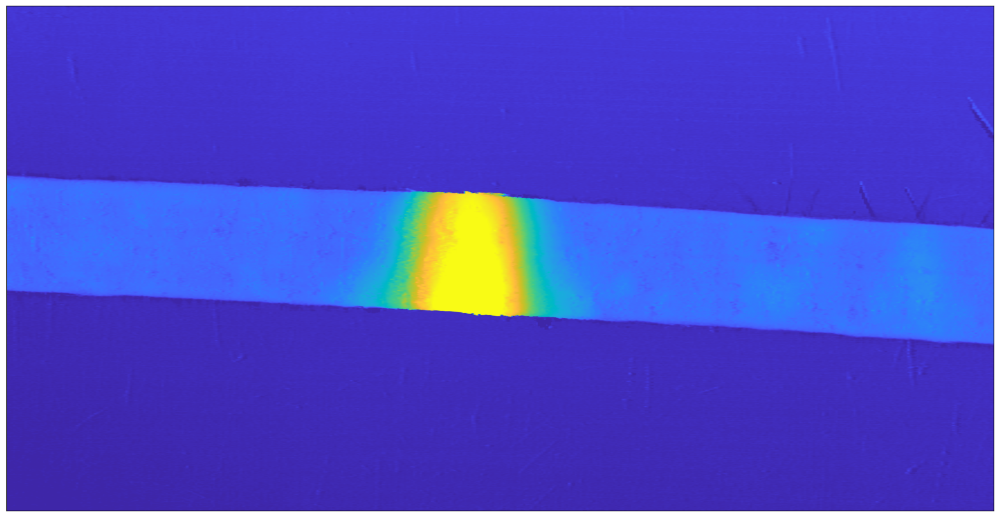

In [5]:
#convert image to array

image_data = np.asarray(img)
#cutoff the end
image_data = image_data[:,:-96,:]
print(f'Image array shape: {image_data.shape}')
#plot array
plt.figure(figsize=(20,12))
plt.imshow(image_data)


ax = plt.gca()

# Hide X and Y axes label marks
ax.xaxis.set_tick_params(labelbottom=False)
ax.yaxis.set_tick_params(labelleft=False)

# Hide X and Y axes tick marks
ax.set_xticks([])
ax.set_yticks([])



save_folder='pictures'
filename = f'{file}.png'
print(filename)
plt.savefig(f'{save_folder}/{filename}', bbox_inches='tight')

Total number of frames: 20
Image shape after 1st reshape: (4000, 2048, 3)
Image shape after 2st reshape: (20, 200, 2048, 3)
Image shape after final reshape: (20, 2048, 200, 3)


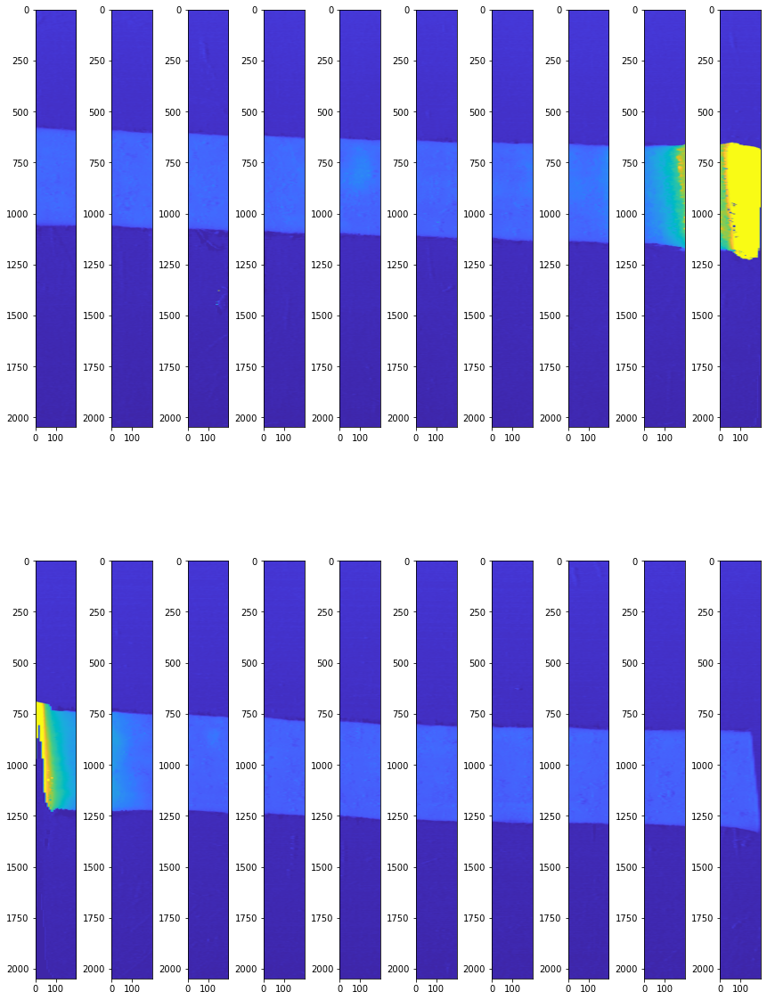

In [5]:
#split strides
stride_step = 200
frames_per_row = 10
frames_nmb = image_data.shape[1]//stride_step
print(f'Total number of frames: {frames_nmb}')
original_shape = image_data.shape

#slice frames
#swap axis
image_data_rsh1 = np.swapaxes(image_data,0,1)
print(f'Image shape after 1st reshape: {image_data_rsh1.shape}')
#reshape
image_data_rsh2 = image_data_rsh1.reshape(frames_nmb, stride_step, original_shape[0], original_shape[2])
print(f'Image shape after 2st reshape: {image_data_rsh2.shape}')
#swap axis back
image_data_frames = np.swapaxes(image_data_rsh2,1,2)
print(f'Image shape after final reshape: {image_data_frames.shape}')

fig, axes = plt.subplots(int(np.ceil(frames_nmb/frames_per_row)),frames_per_row, figsize=(15,20))
fig.subplots_adjust(hspace=0.32, wspace=0.25)
linewidth = 3.0
fontsize_sec = 14


frames_per_row = 10
for i, image_data_frame in enumerate(image_data_frames):
    ii = i//10
    jj = i%10
    ax = axes[ii, jj]
    ax.imshow(image_data_frame)






In [7]:
image_data_frames.shape

(20, 2048, 200, 3)

Total number of frames: 20
Image shape after 1st reshape: (4000, 2048, 3)
Image shape after 2st reshape: (20, 200, 2048, 3)
Image shape after final reshape: (20, 2048, 200, 3)
200.png


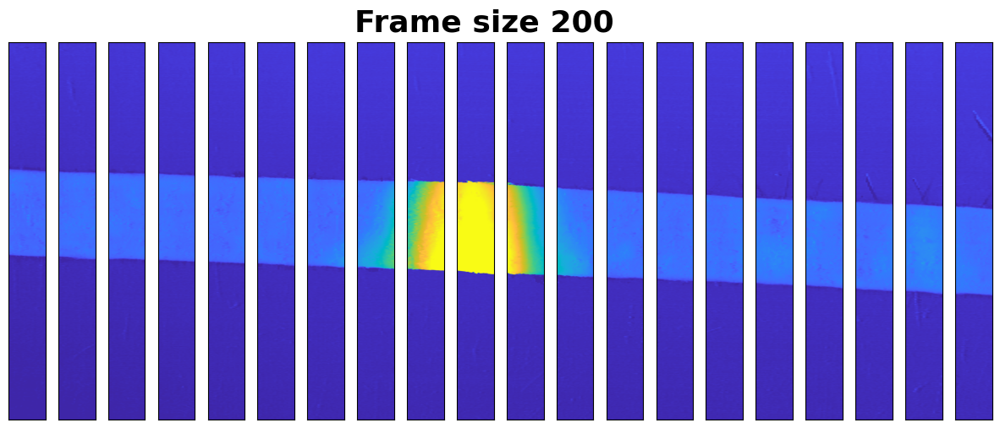

In [39]:
#split strides
stride_step = 200
frames_per_row = 10
frames_nmb = image_data.shape[1]//stride_step
print(f'Total number of frames: {frames_nmb}')
original_shape = image_data.shape

#slice frames
#swap axis
image_data_rsh1 = np.swapaxes(image_data,0,1)
print(f'Image shape after 1st reshape: {image_data_rsh1.shape}')
#reshape
image_data_rsh2 = image_data_rsh1.reshape(frames_nmb, stride_step, original_shape[0], original_shape[2])
print(f'Image shape after 2st reshape: {image_data_rsh2.shape}')
#swap axis back
image_data_frames = np.swapaxes(image_data_rsh2,1,2)
print(f'Image shape after final reshape: {image_data_frames.shape}')

fig, axes = plt.subplots(1,image_data_frames.shape[0], figsize=(15,7))
fig.subplots_adjust(wspace=0.35)

linewidth = 3.0
fontsize_sec = 18


frames_per_row = 10
for i, image_data_frame in enumerate(image_data_frames):
    ax = axes[i]
    ax.imshow(image_data_frame)
    
    ax.set_xticks([])
    ax.set_yticks([])
    
pad = 0.01
fig.suptitle(f'Frame size {stride_step}', 
             fontsize=fontsize_sec+8, 
             fontweight='bold',
             y=ax.get_position().y1 + pad, verticalalignment="bottom"
             
            )
    

save_folder='pictures/paper_pictures/split_frames/'
filename = f'{stride_step}.png'
print(filename)
plt.savefig(f'{save_folder}/{filename}', bbox_inches='tight')

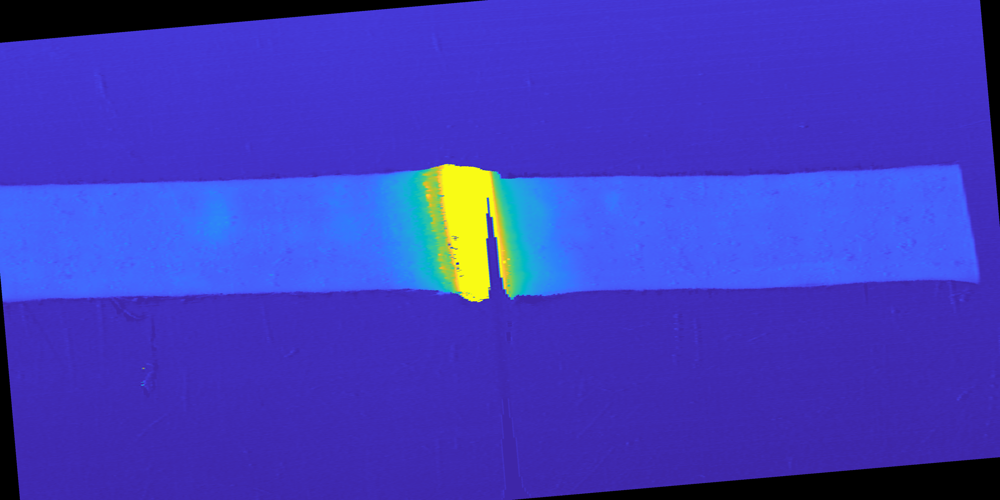

In [6]:
#turn image
#convert image to array
angle = 5
img_rotated = img.rotate(angle)
display(img_rotated)

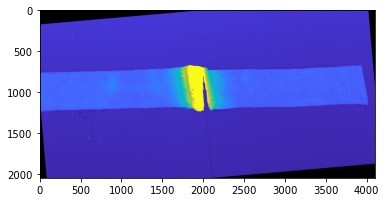

In [11]:
image_data_rotate = np.array(img_rotated)
plt.imshow(image_data_rotate)

In [12]:
#color used for replacement from top left corner
r2,g2,b2 = image_data[0,0]
#create mask where pixels are black
r1, g1, b1 = image_data_rotate[:,:,0], image_data_rotate[:,:,1], image_data_rotate[:,:,2]
mask = (r1 == 0) & (g1 == 0) & (b1 == 0)
#replace black pixels
image_data_rotate[:,:,:3][mask] = [r2, g2, b2]

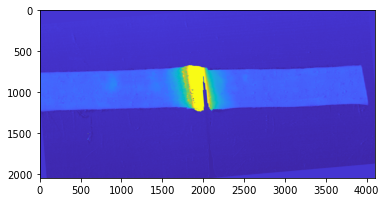

In [13]:
plt.imshow(image_data_rotate)

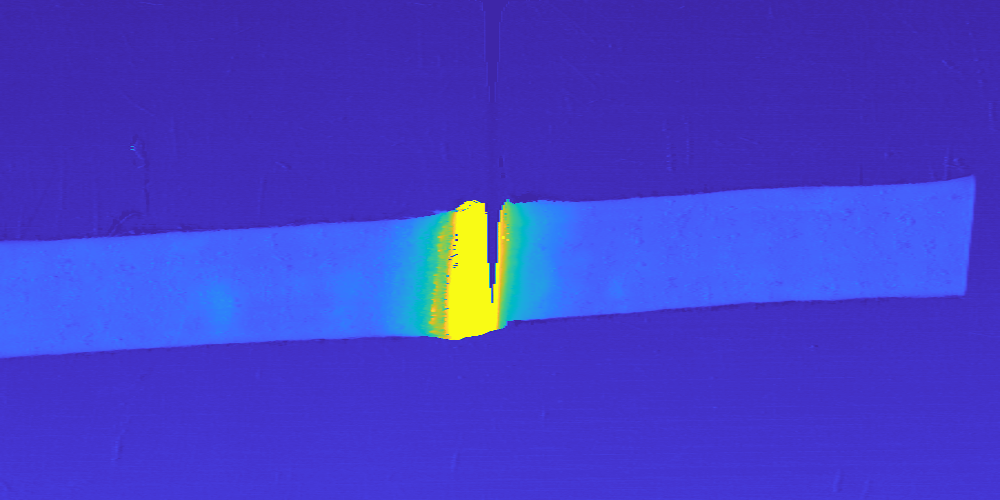

In [14]:
img_Flip_T_B = img.transpose(Image.FLIP_TOP_BOTTOM )
display(img_Flip_T_B)